In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import sys
import matplotlib.pyplot as plt
import shap
import plotly.express as px


In [2]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score, f1_score
from sklearn.metrics import RocCurveDisplay, roc_curve, auc, recall_score
from sklearn.metrics import precision_score
import xgboost as xgb
from numpy import loadtxt
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedKFold, RepeatedStratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.metrics import confusion_matrix  
import glob
from sklearn.model_selection import GridSearchCV
from sklearn.manifold import TSNE



In [3]:
def string_to_float(string):
    return float(string.strip('[]'))


In [4]:
file_list_e = ['/lustrehome/mbossa/Nuses/Analysis/e-Mono_20GeV_inclined_-30_30_75_20000_evts/NUSES_wt_CaloHERDe-Mono_20000-0.25_inclined_-30_30_75_20000-evt-0', '/lustrehome/mbossa/Nuses/Analysis/e-Mono_20GeV_inclined_-30_30_75_20000_evts/NUSES_wt_CaloHERDe-Mono_20000-0.25_inclined_-30_30_75_20000-evt-1', '/lustrehome/mbossa/Nuses/Analysis/e-Mono_20GeV_inclined_-30_30_75_20000_evts/NUSES_wt_CaloHERDe-Mono_20000-0.25_inclined_-30_30_75_20000-evt-2', '/lustrehome/mbossa/Nuses/Analysis/e-Mono_20GeV_inclined_-30_30_75_20000_evts/NUSES_wt_CaloHERDe-Mono_20000-0.25_inclined_-30_30_75_20000-evt-3', '/lustrehome/mbossa/Nuses/Analysis/e-Mono_20GeV_inclined_-30_30_75_20000_evts/NUSES_wt_CaloHERDe-Mono_20000-0.25_inclined_-30_30_75_20000-evt-4']
file_list_p = ['/lustrehome/mbossa/Nuses/Analysis/protonMono_20GeV_inclined_-30_30_75_20000_evts/NUSES_wt_CaloHERDprotonMono_20000-0.25_inclined_-30_30_75_20000-evt-0', '/lustrehome/mbossa/Nuses/Analysis/protonMono_20GeV_inclined_-30_30_75_20000_evts/NUSES_wt_CaloHERDprotonMono_20000-0.25_inclined_-30_30_75_20000-evt-2', '/lustrehome/mbossa/Nuses/Analysis/protonMono_20GeV_inclined_-30_30_75_20000_evts/NUSES_wt_CaloHERDprotonMono_20000-0.25_inclined_-30_30_75_20000-evt-3', '/lustrehome/mbossa/Nuses/Analysis/protonMono_20GeV_inclined_-30_30_75_20000_evts/NUSES_wt_CaloHERDprotonMono_20000-0.25_inclined_-30_30_75_20000-evt-4']

In [5]:
df_list_e = [pd.read_csv(file) for file in file_list_e]
combined_df_e = pd.concat(df_list_e, ignore_index=True)
combined_df_e.to_csv('combined_df_e.csv', index=False)

In [6]:
df_list_p = [pd.read_csv(file) for file in file_list_p]
combined_df_p = pd.concat(df_list_p, ignore_index=True)
combined_df_p.to_csv('combined_df_p.csv', index=False)

In [7]:
df_e = pd.read_csv('combined_df_e.csv')
df_p = pd.read_csv('combined_df_p.csv')

In [8]:
df_e['R1'] = df_e['R1'].apply(string_to_float)
df_e['R2'] = df_e['R2'].apply(string_to_float)
df_e['R4'] = df_e['R4'].apply(string_to_float)
df_e['R5'] = df_e['R5'].apply(string_to_float)
df_e['R6'] = df_e['R6'].apply(string_to_float)

df_p['R1'] = df_p['R1'].apply(string_to_float)
df_p['R2'] = df_p['R2'].apply(string_to_float)
df_p['R4'] = df_p['R4'].apply(string_to_float)
df_p['R5'] = df_p['R5'].apply(string_to_float)
df_p['R6'] = df_p['R6'].apply(string_to_float)


In [9]:
df_e['R3'] = df_e['R3'].apply(lambda x: eval(x) if isinstance(x, str) else np.nan)
df_p['R3'] = df_p['R3'].apply(lambda x: eval(x) if isinstance(x, str) else np.nan)

In [10]:
for i in range(25):
        df_e[f'R3_{i+1}'] = df_e['R3'].apply(lambda x: x[i] if isinstance(x, list) and i < len(x) else 0)
df2 = df_e.drop(columns=['R3'])

In [11]:
for i in range(25):
        df_p[f'R3_{i+1}'] = df_p['R3'].apply(lambda x: x[i] if isinstance(x, list) and i < len(x) else 0)
df2_p = df_p.drop(columns=['R3'])

In [12]:
df2['y_true'] = 0
df2_p['y_true'] = 1

In [13]:
combined_df = pd.concat([df2, df2_p])
shuffled_df = combined_df.sample(frac=1).reset_index(drop=True)
y_true = shuffled_df['y_true'].values

In [14]:
#xgb classifier
param_grid_xgb = {
    'max_depth': [3],#, 5, 6],6 e' il max
    'learning_rate': [0.1],# 0.01, 0.001],
    'subsample': [0.5],# 0.7, 1],
   # 'reg_alpha':[0],# 0.5, 1, 5],
    #'reg_lambda':[0],# 0.5, 1, 5]   
}

xgb_model = xgb.XGBClassifier(tree_method="hist",seed=0)
grid_search = GridSearchCV(xgb_model, param_grid_xgb, cv=5, scoring='accuracy',refit=True)
# Fit the GridSearchCV object to the training data
X_train, X_test, y_train, y_test = train_test_split(shuffled_df.iloc[:, 1:-1], shuffled_df.iloc[:, -1], test_size=0.3, random_state=0)
#X_val, X_test1, Y_val, Y_test1 = train_test_split(X_test, y_test, test_size=0.1, random_state=0)
grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_

In [15]:
y_pred = best_model.predict(X_test)
predictions_xgb = [round(value) for value in y_pred]
# evaluate predictions
accuracy_xgb = accuracy_score(y_test, predictions_xgb)
recall_xgb = recall_score(y_test, y_pred)
precision_xgb = precision_score(y_test, y_pred)


print("Accuracy XGB Classifier: %.2f%%" % (accuracy_xgb * 100.0))
print("Recall XGB Classifier: %.2f%%" % (recall_xgb * 100.0))
print("Precision XGB Classifier: %.2f%%" % (precision_xgb * 100.0))


Accuracy XGB Classifier: 99.95%
Recall XGB Classifier: 99.93%
Precision XGB Classifier: 99.96%


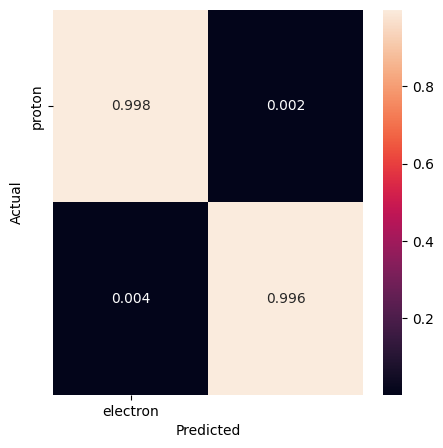

In [20]:
conf_matrix_xgb = confusion_matrix(y_test, predictions_xgb, normalize='true')
fig, ax = plt.subplots(figsize=(5,5))
sns.heatmap(conf_matrix_xgb, annot=True, fmt='.3f',xticklabels=['electron'], yticklabels=['proton'])
plt.ylabel('Actual')
plt.xlabel('Predicted')
#plt.show(block=False)
plt.savefig('Confusion_matrix_XGB_10GeV_inclined30')

In [19]:
#m = TSNE(learnign_rate = 50)
# Analisi t-SNE
# Usa i dati di validazione per t-SNE
X_val_df = pd.DataFrame(X_val)  # Assicurati che X_val sia un DataFrame
tsne = TSNE(n_components=2, random_state=0)
X_val_tsne = tsne.fit_transform(X_val_df)


KeyboardInterrupt: 

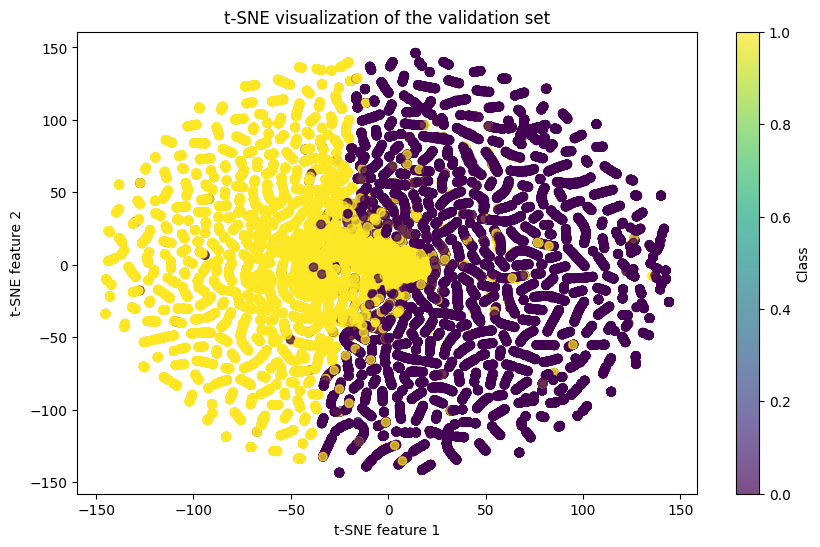

In [22]:
plt.figure(figsize=(10, 6))
scatter = plt.scatter(X_val_tsne[:, 0], X_val_tsne[:, 1], c=Y_val, cmap='viridis', alpha=0.7)
plt.colorbar(scatter, label='Class')
plt.xlabel('t-SNE feature 1')
plt.ylabel('t-SNE feature 2')
plt.title('t-SNE visualization of the validation set')
#0 elettrone
#1 protone
plt.savefig('TSNE_validation_XGB_10GeV_inclined30.png')
#plt.show()

In [23]:
tsne = TSNE(n_components=3, random_state=0)
X_val_tsne = tsne.fit_transform(X_val_df)

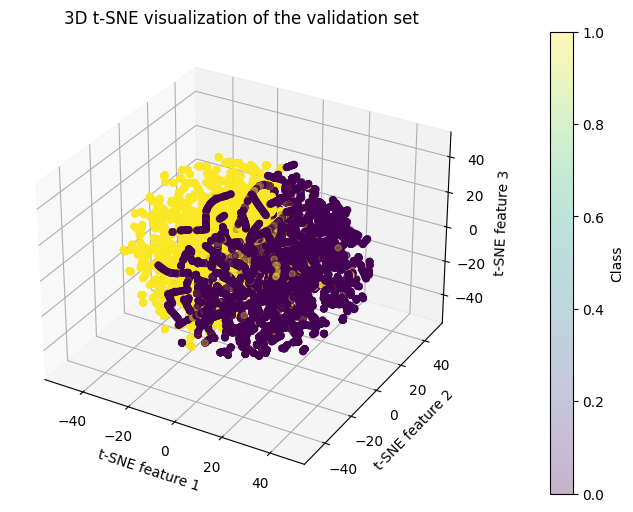

In [24]:
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_val_tsne[:, 0], X_val_tsne[:, 1], X_val_tsne[:, 2], c=Y_val, cmap='viridis', alpha=0.3)
colorbar = plt.colorbar(scatter, ax=ax, pad=0.1)
colorbar.set_label('Class')
ax.set_xlabel('t-SNE feature 1')
ax.set_ylabel('t-SNE feature 2')
ax.set_zlabel('t-SNE feature 3')
ax.set_title('3D t-SNE visualization of the validation set')
plt.savefig('TSNE_validation_10GeV_inclined30.png')
plt.show()

In [25]:
fig = px.scatter_3d(
    x=X_val_tsne[:, 0],
    y=X_val_tsne[:, 1],
    z=X_val_tsne[:, 2],
    color=Y_val,
    labels={'color': 'Class'},
    title='3D t-SNE visualization of the validation set'
)

fig.update_traces(marker=dict(size=5, opacity=0.7))
fig.update_layout(scene = dict(
                    xaxis_title='t-SNE feature 1',
                    yaxis_title='t-SNE feature 2',
                    zaxis_title='t-SNE feature 3'),
                    width=1200,
                    height=800,
                    margin=dict(r=20, b=10, l=10, t=10))

fig.show()

In [16]:
#results_df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
#print(results_df)

        Actual  Predicted
54458        0          0
118646       0          0
57401        1          1
115324       0          0
71684        0          0
...        ...        ...
141659       1          1
158793       0          0
119108       1          1
184138       1          1
181869       0          0

[60000 rows x 2 columns]


/usr/local/lib/python3.8/dist-packages/xgboost/sklearn.py:861: UserWarning:

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.



[0]	validation_0-logloss:0.60044	validation_1-logloss:0.60049
[1]	validation_0-logloss:0.52445	validation_1-logloss:0.52452
[2]	validation_0-logloss:0.46105	validation_1-logloss:0.46118
[3]	validation_0-logloss:0.40734	validation_1-logloss:0.40750
[4]	validation_0-logloss:0.36141	validation_1-logloss:0.36157
[5]	validation_0-logloss:0.32177	validation_1-logloss:0.32195
[6]	validation_0-logloss:0.28751	validation_1-logloss:0.28773
[7]	validation_0-logloss:0.25756	validation_1-logloss:0.25781
[8]	validation_0-logloss:0.23138	validation_1-logloss:0.23167
[9]	validation_0-logloss:0.20819	validation_1-logloss:0.20850
[10]	validation_0-logloss:0.18781	validation_1-logloss:0.18813
[11]	validation_0-logloss:0.16977	validation_1-logloss:0.17017
[12]	validation_0-logloss:0.15365	validation_1-logloss:0.15407
[13]	validation_0-logloss:0.13931	validation_1-logloss:0.13973
[14]	validation_0-logloss:0.12651	validation_1-logloss:0.12698
[15]	validation_0-logloss:0.11512	validation_1-logloss:0.11561
[1

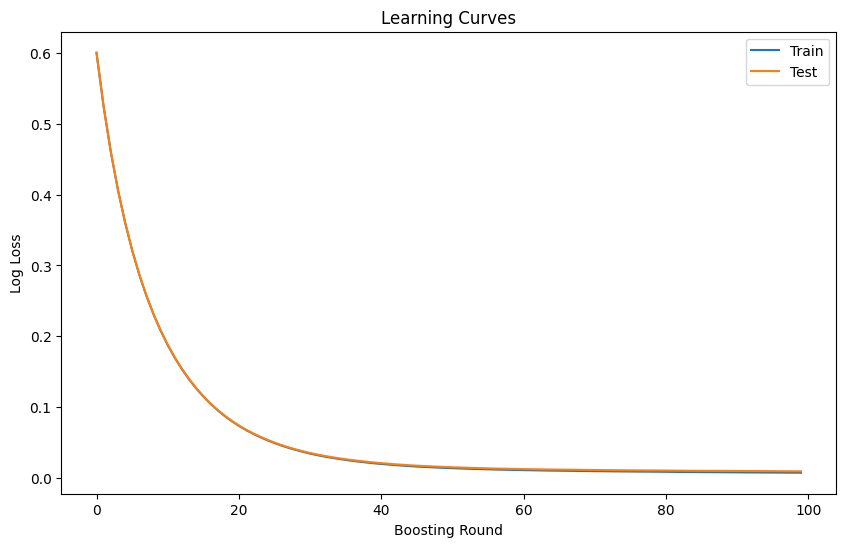

In [26]:
eval_set = [(X_train, y_train), (X_val, Y_val)]

# Addestra il modello con il set di valutazione
best_model.fit(X_train, y_train, eval_metric='logloss', eval_set=eval_set, verbose=True)
# Recupera i risultati della valutazione
results = best_model.evals_result()

# Visualizza le curve di apprendimento
epochs = len(results['validation_0']['logloss'])
x_axis = range(0, epochs)
plt.figure(figsize=(10, 6))
plt.plot(x_axis, results['validation_0']['logloss'], label='Train')
plt.plot(x_axis, results['validation_1']['logloss'], label='Test')
plt.xlabel('Boosting Round')
plt.ylabel('Log Loss')
plt.title('Learning Curves')
plt.legend()
#plt.show()
plt.savefig('LogLoss_validation_XGB_10GeV_inclined30.png')

In [29]:
#misclassified = X_test[(predictions_xgb != y_test)]
##misclassified_labels = y_test[(predictions_xgb != y_test)]
#predicted_labels = y_pred[(predictions_xgb != y_test)]

# Crea un DataFrame con i casi di errore
#misclassified_df = pd.DataFrame(misclassified)
#misclassified_df['True Label'] = misclassified_labels
#misclassified_df['Predicted Label'] = predicted_labels

# Visualizza i casi di errore
#print("Misclassified Cases:")
#print(misclassified_df)


Misclassified Cases:
                 R1        R2          R4     R5     R6      R3_1      R3_2  \
5507   1.802305e-08  0.193206   90.949512  540.0 -120.0  0.144726  0.157483   
12981  3.517627e-03  0.262600  210.527750  570.0 -120.0  0.062180  0.242517   
15815  1.629337e-05  0.294762  162.114705  630.0 -120.0  0.022493  0.110599   
342    3.993729e-08  0.301828  241.457969  720.0 -150.0  0.007640  0.127053   
17931  3.209548e-05  0.288253  300.469674  570.0 -120.0  0.019383  0.186225   
19590  8.638898e-04  0.254208  432.872811  750.0  -90.0  0.178781  0.254208   
12704  2.606967e-05  0.344742  332.112570  750.0 -150.0  0.028027  0.127706   
18811  2.337947e-04  0.266678  153.677412  690.0 -120.0  0.035143  0.153865   
11848  6.313638e-05  0.357057  299.761960  480.0  -90.0  0.049575  0.327352   
11707  5.114912e-05  0.289037  322.776360  600.0 -120.0  0.034464  0.144784   

           R3_3      R3_4      R3_5  ...     R3_18         R3_19  \
5507   0.193206  0.181910  0.136664  ... 

In [16]:
explainer = shap.Explainer(best_model, X_train)
explainer = shap.TreeExplainer(best_model, check_additivity=False)


In [17]:
X_train = pd.DataFrame(shuffled_df.iloc[:, 1:-1])
X_test = pd.DataFrame(shuffled_df.iloc[:, 1:-1])

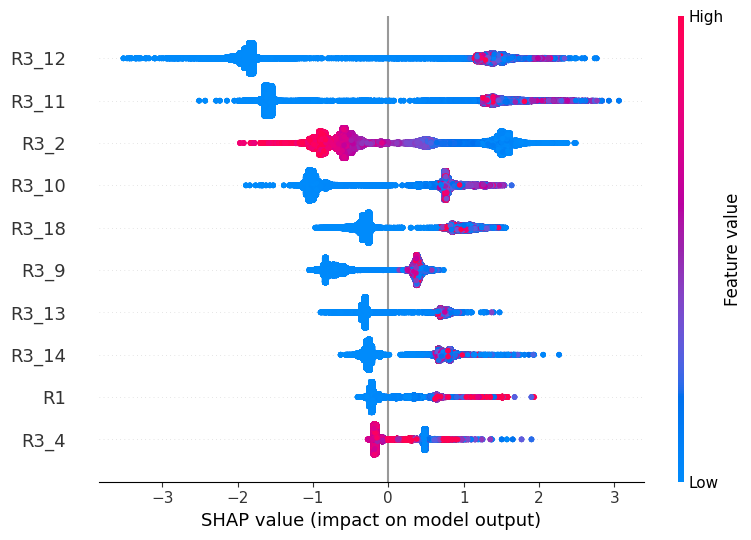

In [18]:
shap_values = explainer.shap_values(X_test)
fig = shap.summary_plot(shap_values, X_test, show=False, max_display=10)
plt.savefig('XAI_XGB_20 Gev inclined.png')

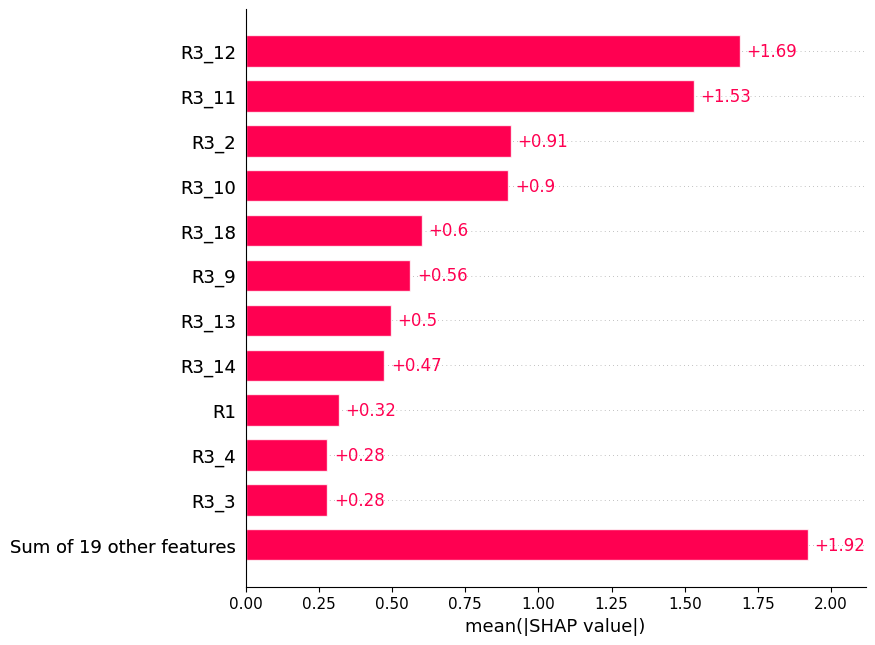

In [24]:
#explainer = shap.Explainer(best_model, X_train)
shap_values = explainer(X_test)

#shap.plots.bar(shap_values.mean(0), max_display=12, show=False)
shap.plots.bar(shap_values.abs.mean(0), max_display=12, show=False)
plt.savefig('XAI_XGB_20Gev_inclined_bar.png')

#plt.show()

#plt.gcf()
